Program to display the mesh generated for **any convex polygon surface** inside the room and also to calculate the intensity at each grid point on the surface based on the power of **'n' bulbs** provided by the user 

In [ ]:
import numpy as np
import time
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import warnings
warnings.filterwarnings('ignore')
from scipy.spatial import ConvexHull
from scipy.spatial import distance

def user_input():
  min_power = 5 ; max_power = 100 ; n_vert_min = 3 ; n_vert_max = 15 ; side_limit = 0.1;
  d_min = [1,1,1] ; d_max = [20,20,20]

  power = []
  while True:  
    dimension = input("Enter the dimensions of the room as a,b,c : ")
    try: 
      dim  = [float(i) for i in dimension.split(",")]
      if len(dim)!=3 or (dim[0] < d_min[0]) or (dim[0] > d_max[0]) or (dim[1] < d_min[1]) or (dim[1] > d_max[1]) or (dim[2] < d_min[2]) or (dim[2] > d_max[2]):
        raise Exception  
    except ValueError: 
      print("Please enter dimensions of the room as a,b,c") 
      continue 
    except Exception:
      print("Room dimensions has to 3 dimensional and has to be in range(1,10) ")   
    else: 
      a = np.array(dim)[0]; b = np.array(dim)[1]; c = np.array(dim)[2]
      break

  while True:  
    n_b = input("Enter the number of bulbs: ")
    try: 
      n_bulbs = int(n_b) 
      if n_bulbs < 1 or n_bulbs > 10:
        raise Exception  
    except ValueError: 
      print("Please provide with suitable integer value for the number of bulb(s)") 
      continue 
    except Exception:
      print("Number of bulb(s) has to be between 1 and 10")   
    else: 
      break

  for i in range(0, n_bulbs):
    while True:  
      user_in = input("Enter the power for bulb %d : "%(i+1)) 
      try: 
        result = float(user_in) 
        if result < min_power or result > max_power :
          raise Exception  
      except ValueError: 
        print("Please enter only decimal value for power of bulb %d "%(i+1)) 
        continue 
      except Exception:
        print("Power of bulb has to be between 5 and 100 Watts")   
      else: 
        power.append(result)
        break

  while True:  
    nv = input("Enter the number of vertices of surface for uniform illumination : ")
    try:  
      n_vert = int(nv)
      if n_vert < n_vert_min or n_vert > n_vert_max:
        raise Exception  
    except ValueError: 
      print("Please provide with suitable integer value for the number of vertices") 
      continue 
    except Exception:
      print("Number of vertices has to be between 3 and 10")   
    else: 
      break
  
  v = np.zeros([n_vert,3])

  def sign(x):
    if x >= 0: return 1
    else: return 0

  def triads(p):
    return zip(p, p[1:]+[p[0]], p[2:]+[p[0]]+[p[1]])

  def check_convexity(p):
    if p ==[]:
      return False

    elif len(p)!=n_vert:
      return False

    else:
      i = 0
      for ((x0, y0), (x1, y1), (x2,y2)) in triads(p):
          if i==0: fsign = sign(x2*(y1-y0)-y2*(x1-x0)+(x1-x0)*y0-(y1-y0)*x0)
          else:
              newsign = sign(x2*(y1-y0)-y2*(x1-x0)+(x1-x0)*y0-(y1-y0)*x0)
              if newsign != fsign: return False
          i +=1
      return True

  def check_hv_plane(v):
    if np.all(v == np.zeros([n_vert,3])):
      return False
    else:
      return (np.all(v[:,0] == v[0,0]) or np.all(v[:,1] == v[0,1]) or np.all(v[:,2] == v[0,2]))

  def too_close(v):
    if np.all(v == np.zeros([n_vert,3])):
      return False
    else:
      sides = np.zeros((v.shape[0]))
      for i in range(v.shape[0]-1):
        sides[i] = np.sqrt(np.sum(np.square(v[i+1,:]-v[i,:])))
      sides[-1] = np.sqrt(np.sum(np.square(v[-1,:]-v[0,:])))
      if np.min(sides) < side_limit:
        print(np.min(sides))
        return True
      else:
        return False  

  vertices = []; counter = 0;
  while not check_convexity(vertices) or not check_hv_plane(v) or too_close(v):
    vertices = []
    counter +=1
    num = 0
    if counter > 1:
      print("Vertices are either not in horizontal/vertical plane or do not form convex polygon or are too close")
    for n in range(n_vert):
      while True:  
        xyz_poly = input(" Enter the coordinates of the vertice %d : "%(n+1)) 
        try: 
          xyz_dim = [float(val) for val in xyz_poly.split(",")]
          if len(xyz_dim)!=3 or xyz_dim[0] < 0 or xyz_dim[0] > a or xyz_dim[1] < 0 or xyz_dim[1] > b or xyz_dim[2] < 0 or xyz_dim[2] > c:
            raise Exception  
        except ValueError: 
          print("Please enter coordinates of vertice %d as x,y,z "%(n+1)) 
          continue 
        except Exception:
          print("Vertices have to be within the bounds of the room")   
        else: 
          num += 1
          v[n,0] = xyz_dim[0] ; v[n,1] = xyz_dim[1] ; v[n,2] = xyz_dim[2];
          if num ==1:
            vertices.append(v[n,:].tolist())
          if num == 2:
            if np.all(v[num-1,0] == v[0,0]):
              index = 0
            elif np.all(v[num-1,1] == v[0,1]):
              index = 1
            elif np.all(v[num-1,2] == v[0,2]):
              index = 2          
          ver = []
          if num > 1:
            for i in range(len(xyz_dim)):              
              if i!=index:
                ver.append(v[num-1,i])               
            vertices.append(ver)
          break
    
    del vertices[0][index]    

    vertices = np.array(vertices)

    vertices_sorted = sortpts_clockwise(vertices.tolist())

    vertices = vertices_sorted

  for i in range(n_vert):
    vertices[i].insert(index, 0)
  
  vert_sort = np.array(vertices)

  vert = np.zeros((n_vert,3))
  for j in range(3):
    vert[:,j] = [item[j] for item in vert_sort]
    if j==index:
      vert[:,j] = v[0,index]
      j += 1
  v = vert
  
  return a, b, c, n_bulbs, nv, v, power

def sortpts_clockwise(points):

    TURN_LEFT, TURN_RIGHT, TURN_NONE = (1, -1, 0)

    def cmp(a, b):
        return (a > b) - (a < b)

    def turn(p, q, r):
        return cmp((q[0] - p[0])*(r[1] - p[1]) - (r[0] - p[0])*(q[1] - p[1]), 0)

    def _keep_left(hull, r):
        while len(hull) > 1 and turn(hull[-2], hull[-1], r) != TURN_LEFT:
            hull.pop()
        if not len(hull) or hull[-1] != r:
            hull.append(r)
        return hull

    points = sorted(points)
    l = reduce(_keep_left, points, [])
    u = reduce(_keep_left, reversed(points), [])
    return l.extend(u[i] for i in range(1, len(u) - 1)) or l

def polygon_grid_points( n, v):
  nv = np.shape(v)[0]
  ng = 1 + nv * (n*(n + 1)) // 2
  xg = np.zeros ([ng,3])
  p = 0
  #  Determine the centroid
  vc = np.zeros (3)
  for i in range (0,nv):
    vc[0] = vc[0] + v[i,0]
    vc[1] = vc[1] + v[i,1]
    vc[2] = vc[2] + v[i,2]
  vc[0] = vc[0] / float (nv)
  vc[1] = vc[1] / float (nv)
  vc[2] = vc[2] / float (nv)

  #  Use the centroid as the first grid point
  xg[p,0] = vc[0]
  xg[p,1] = vc[1]
  xg[p,2] = vc[2]
  p = p + 1

  #  Consider each triangle formed by two consecutive vertices and the centroid but skip the first line of points
  for l in range (0, nv):
    lp1 = ( l % nv )
    for i in range ( 1, n + 1 ):
      for j in range ( 0, n - i + 1 ):
        k = n - i - j
        xg[p,0] = (float (i) * v[l,0] + float (j) * v[lp1,0] + float (k) * vc[0]) / float (n)
        xg[p,1] = (float (i) * v[l,1] + float (j) * v[lp1,1] + float (k) * vc[1]) / float (n)
        xg[p,2] = (float (i) * v[l,2] + float (j) * v[lp1,2] + float (k) * vc[2]) / float (n)
        p = p + 1
  return xg

def triangle_grid_points ( n, t):
  ng = ((n + 1) * (n + 2)) // 2
  tg = np.zeros ((ng,3))
  p = 0
  for i in range (0,n + 1):
    for j in range (0,n + 1 - i):
      tg[p,0] = (float (i) * t[0,0] + float (j) * t[1,0] + float (n - i - j) * t[2,0])/ float (n)
      tg[p,1] = (float (i) * t[0,1] + float (j) * t[1,1] + float (n - i - j) * t[2,1])/ float (n)
      tg[p,2] = (float (i) * t[0,2] + float (j) * t[1,2] + float (n - i - j) * t[2,2])/ float (n)
      p = p + 1
  return tg
  
def polygon_grid(v, a, b, c, n):  
  nv = v.shape[0]
  xg = polygon_grid_points (n, v)
  #  Determine the centroid
  vcx = 0.0 ; vcy = 0.0 ; vcz = 0.0
  for i in range (0, nv):
    vcx = vcx + v[i,0]
    vcy = vcy + v[i,1]
    vcz = vcz + v[i,2]
  vcx = vcx / float (nv)
  vcy = vcy / float (nv)
  vcz = vcz / float (nv)

  ng_t = ((n + 1) * (n + 2)) // 2
  t = np.zeros([ng_t, 3])
  t_g = np.zeros([ng_t*nv,3])  
  for i in range(1,nv):
    t = np.array ([xg[0,:], v[i-1,:], v[i,:]])
    t_g[(i-1)*ng_t:i*ng_t,:] = triangle_grid_points (n,t)

  t = np.array ([xg[0,:], v[nv-1,:], v[0,:]])
  t_g[(nv-1)*ng_t:nv*ng_t,:] = triangle_grid_points (n,t)
  return t_g, vcx, vcy, vcz

def poly_grid_display(v, a, b, c, n_g):
  nv = v.shape[0]
  t_g, vcx, vcy, vcz = polygon_grid(v, a, b, c, n_g)
  fig = plt.figure()
  ax = fig.add_subplot(projection='3d')
  ax.set_xlim(0, float (a))
  ax.set_ylim(0, float (b))
  ax.set_zlim(0, float (c))
  ax.set_xlabel('X', labelpad = 250)
  ax.set_ylabel('Y', labelpad = 250)
  ax.set_zlabel('Z', labelpad = 200)
    
  #  Plot the outline of the polygon
  ax.plot3D (v[0:nv,0], v[0:nv,1], v[0:nv,2], linewidth = 2.0, color = 'k')
  ax.plot3D ([v[nv-1,0], v[0,0]], [v[nv-1,1],v[0,1]], [v[nv-1,2],v[0,2]], linewidth = 2.0, color = 'k')

  #  Plot the internal "ribs"
  for i in range (0, nv):
    ax.plot3D ([v[i,0], vcx], [v[i,1], vcy], [v[i,2], vcz], linewidth = 2.0, color = 'k')

  #  Plot the gridpoints
  ax.scatter3D (t_g[:,0], t_g[:,1], t_g[:,2],'bs', s=500)
  plt.show()

def plot_intensities(v, a, b, c, xyz, n_g):
  t_g, _, _, _ = polygon_grid(v, a, b, c, n_g)
  I, r = intensities(xyz, power, n_bulbs, t_g)

  fig = plt.figure()
  ax = fig.add_subplot(projection='3d')
  ax.set_xlim(0, float (a))
  ax.set_ylim(0, float (b))
  ax.set_zlim(0, float (c))  
  ax.set_xlabel('X', labelpad = 250)
  ax.set_ylabel('Y', labelpad = 250)
  ax.set_zlabel('Z', labelpad = 200)
  intensity = ax.scatter3D(t_g[:,0], t_g[:,1], t_g[:,2], c = I , cmap='viridis', s = 1000) 
  
  # Bulb positions and their annotation in 3D space
  bulb_pos = xyz
  x_pos = []; y_pos = [] ; z_pos = []
  for nb in range(n_bulbs):
    x_pos.append(bulb_pos[3*nb])
    y_pos.append(bulb_pos[3*nb+1])
    z_pos.append(bulb_pos[3*nb+2])

  for i in range(len(x_pos)):                          
    ax.scatter(x_pos[i],y_pos[i],z_pos[i], 'bs', s = 5000) 
  
  zdirs = [None for i in range(len(x_pos))]
  ii = 0  
  for zdir, x, y, z in zip(zdirs, x_pos, y_pos, z_pos):
    label = '   Bulb %d (%.2f, %.2f, %.2f)' % (ii+1, x, y, z)
    ax.text(x, y, z, label, zdir)
    ii = ii + 1
  
  # plot colorbar
  cbar = plt.colorbar(intensity, shrink = 0.6, ax = [ax], location = 'left') 
  cbar.set_label('Intensity', labelpad = 100)
  cbar.mappable.set_clim(0,max(I))
  plt.show()

def intensities(coordinates, power, n_bulbs, t_g):
  pmax = np.shape(t_g)[0]
  r = np.zeros([pmax,n_bulbs])
  I = np.zeros([pmax,1])

  for nb in range(n_bulbs):
    for p in range(pmax):  
      r[p,nb]= np.sqrt(np.square(t_g[p,0]-coordinates[3*nb])+np.square(t_g[p,1]-coordinates[3*nb+1])+np.square(t_g[p,2]-coordinates[3*nb+2]))

  for nb in range(n_bulbs):
    for p in range(pmax):
        I[p] = I[p] + (power[nb] / (4 *np.pi*np.square(r[p,nb]))) 

  return I, r

def objective(x):
  I, r = intensities(x, power, n_bulbs, t_g)  
  return np.sqrt(np.sum(np.square(I - np.mean(I))/(np.shape(I)[0])))

def bound_limit(v, a, b, c, surf_wall_dist_ratio):
  if np.all(v[:,0] == v[0,0]):
    index = 0
  elif np.all(v[:,1] == v[0,1]):
    index = 1
  elif np.all(v[:,2] == v[0,2]):
    index = 2     
  else:
    index = None
 
  # define range for input
  bound_a = [0,a] ; bound_b = [0,b] ; bound_c = [0,c]
  bounds = []
  for nb in range(n_bulbs):
    bounds.append(bound_a)
    bounds.append(bound_b)
    bounds.append(bound_c)
  
  result = None
  if ((v[0,index] - np.min(bounds[index])) > (surf_wall_dist_ratio * np.max(bounds[index]))) and ((np.max(bounds[index]) - v[0,index]) > (surf_wall_dist_ratio * np.max(bounds[index]))):
    while True:  
      user_in = input("Which surface you want to be illuminated? \n 1. Surface facing the origin \n 2. Surface away from the origin \n") 
      try: 
        result = int(user_in) 
        if (result!= 1) and (result != 2):
          raise Exception  
      except ValueError: 
        print("Valid options are only integers (1 and 2) ") 
        continue 
      except Exception:
        print("Invalid option selected. Only 1 or 2 are allowed.")   
      else: 
        break    
    
  if result == 1:
    condition = True
  elif result ==2:
    condition = False  
  else:
    condition = None

  return condition, index, bounds

def determine_bounds(v, a, b, c, surf_wall_dist_ratio):
  condition, index, bounds = bound_limit(v, a, b, c, surf_wall_dist_ratio) 
  if condition == True:
    for nb in range(n_bulbs):
      bounds[3*nb+index] = [np.min(bounds[3*nb+index]), v[0,index]]
  elif condition == True:
    for nb in range(n_bulbs):
      bounds[3*nb+index] = [v[0,index],np.max(bounds[3*nb+index])]
  elif condition == None:
    pass
  return bounds

a, b, c, n_bulbs, nv, v, power = user_input()
t_g, _, _, _ = polygon_grid(v, a, b, c, n = 10)                         
bounds = determine_bounds(v, a, b, c, surf_wall_dist_ratio = 0.3)


Enter the dimensions of the room as a,b,c : 7,7,7
Enter the number of bulbs: 1
Enter the power for bulb 1 : 10
Enter the number of vertices of surface for uniform illumination : 12
 Enter the coordinates of the vertice 1 : 3.12,3.11, 1.12
 Enter the coordinates of the vertice 2 : 2.12,3.11, 1.3900000000000001
 Enter the coordinates of the vertice 3 : 1.3900000000000001,3.11, 2.12
 Enter the coordinates of the vertice 4 : 1.12,3.11, 3.12
 Enter the coordinates of the vertice 5 : 1.3900000000000001,3.11, 4.12
 Enter the coordinates of the vertice 6 : 2.12,3.11, 4.85
 Enter the coordinates of the vertice 7 : 3.12,3.11, 5.12
 Enter the coordinates of the vertice 8 : 4.12,3.11, 4.85
 Enter the coordinates of the vertice 9 : 4.85,3.11, 4.12
 Enter the coordinates of the vertice 10 : 5.12,3.11, 3.12
 Enter the coordinates of the vertice 11 : 4.85,3.11, 2.12
 Enter the coordinates of the vertice 12 : 4.12,3.11, 1.3900000000000001
Which surface you want to be illuminated? 
 1. Surface facing th

REPRESENTATION OF SURFACE IN THE ROOM



 Your surface representation inside the room : 



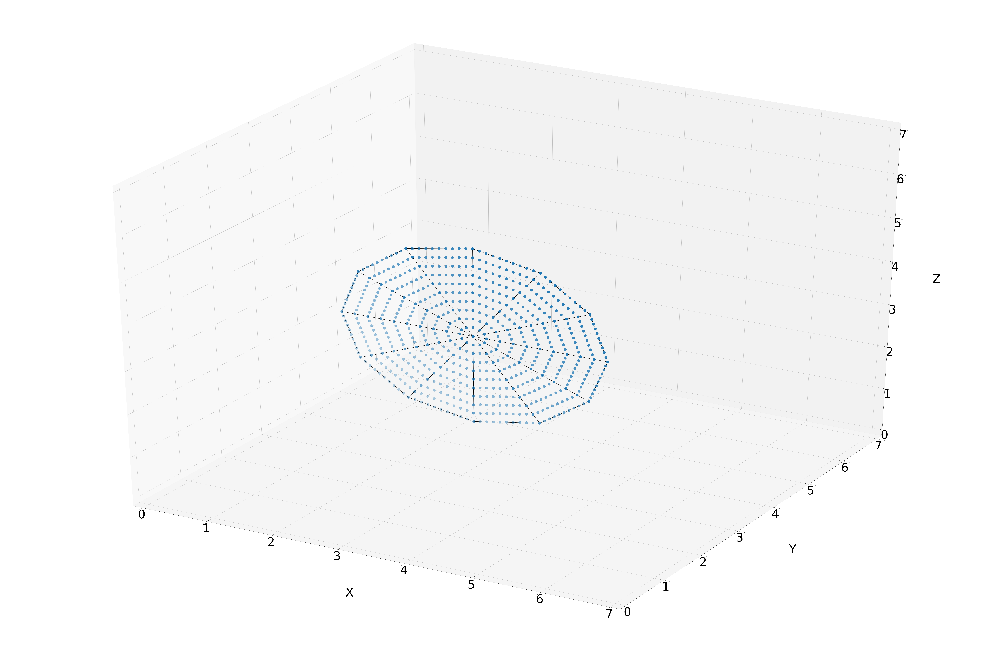

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = [150, 100]
plt.rcParams.update({'font.size': 100})
print('\n Your surface representation inside the room : \n')
poly_grid_display(v, a, b, c, n_g = 10)

BENCHMARKING WITH THE FOLLOWING ALGORITHMS:

1. SHGO

In [ ]:
from scipy.optimize import shgo
from numpy.random import rand
from numpy import random
from numpy.random import rand

start_time = time.time()

random.seed(30)                                     # hyperparameter

# SHGO
result = shgo(objective, bounds)

elapsed = time.time() - start_time
print('\n Computation time =  %.3f'%(elapsed))

# summarize the result
print('Status : %s' % result['message'])
print('Total Evaluations: %d' % result['nfev'])
# evaluate solution
solution = result['x']
evaluation = objective(solution)

print('\n Done!')

bulb_pos = solution ; bulb_position = [] 
for nb in range(n_bulbs):
  temporary = bulb_pos[3*nb:3*nb+3]
  bulb_position.append(temporary)
for nb in range(n_bulbs):
  print('Bulb %d final position = %s'%(nb+1,bulb_position[nb]))
print('Final objective function value = %f '% (evaluation))



 Computation time =  0.160
Status : Optimization terminated successfully.
Total Evaluations: 14

 Done!
Bulb 1 final position = [7. 0. 7.]
Final objective function value = 0.005745 


In [ ]:
# FINAL INTENSITY PLOT
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {}
plt.rcParams['figure.figsize'] = [200, 100]
plt.rcParams.update({'font.size': 100})

print('\n Final intensity plot : \n')
plot_intensities(v, a, b, c, solution, n_g = 200)


 Final intensity plot : 



2. DIFFERENTIAL EVOLUTION

In [ ]:
from scipy.optimize import differential_evolution
from numpy import random

start_time = time.time()

random.seed(30)                                            # hyperparameter

# Differential Evolution
result = differential_evolution(objective, bounds)

elapsed = time.time() - start_time
print('\n Computation time =  %.3f'%(elapsed))

# summarize the result
print('Status : %s' % result['message'])
print('Total Evaluations: %d' % result['nfev'])
# evaluate solution
solution = result['x']
evaluation = objective(solution)

print('\n Done!')

bulb_pos = solution ; bulb_position = [] 
for nb in range(n_bulbs):
  temporary = bulb_pos[3*nb:3*nb+3]
  bulb_position.append(temporary)
for nb in range(n_bulbs):
  print('Bulb %d final position = %s'%(nb+1,bulb_position[nb]))
print('Final objective function value = %f '% (evaluation))



 Computation time =  17.880
Status : Optimization terminated successfully.
Total Evaluations: 1632

 Done!
Bulb 1 final position = [7. 0. 7.]
Final objective function value = 0.005745 


In [ ]:
# FINAL INTENSITY PLOT
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {}
plt.rcParams['figure.figsize'] = [200, 100]
plt.rcParams.update({'font.size': 100})

print('\n Final intensity plot : \n')
plot_intensities(v, a, b, c, solution, n_g = 200)


 Final intensity plot : 



3. DUAL ANNEALING

In [ ]:
from scipy.optimize import dual_annealing
from numpy import random

start_time = time.time()

random.seed(30)                                                     # hyperparameter

# Differential Evolution
result = dual_annealing(objective, bounds)

elapsed = time.time() - start_time
print('\n Computation time =  %.3f'%(elapsed))

# summarize the result
print('Status : %s' % result['message'])
print('Total Evaluations: %d' % result['nfev'])
# evaluate solution
solution = result['x']
evaluation = objective(solution)

print('\n Done!')

bulb_pos = solution ; bulb_position = [] 
for nb in range(n_bulbs):
  temporary = bulb_pos[3*nb:3*nb+3]
  bulb_position.append(temporary)
for nb in range(n_bulbs):
  print('Bulb %d final position = %s'%(nb+1,bulb_position[nb]))
print('Final objective function value = %f '% (evaluation))



 Computation time =  66.353
Status : ['Maximum number of iteration reached']
Total Evaluations: 6013

 Done!
Bulb 1 final position = [7. 0. 7.]
Final objective function value = 0.005745 


In [ ]:
# FINAL INTENSITY PLOT
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {}
plt.rcParams['figure.figsize'] = [200, 100]
plt.rcParams.update({'font.size': 100})

print('\n Final intensity plot : \n')
plot_intensities(v, a, b, c, solution, n_g = 200)


 Final intensity plot : 



GENETIC ALGORITHM

In [ ]:
from numpy import random
from numpy.random import rand

# decode bitstring to numbers
def decode( bounds, n_bits, bitstring):
  decoded = list()
  largest = 2**n_bits
  for i in range(len(bounds)):
    # extract the substring
    start, end = i * n_bits, (i * n_bits)+n_bits
    substring = bitstring[start:end]
    # convert bitstring to a string of chars
    chars = ''.join([str(s) for s in substring])
    # convert string to integer
    integer = int(chars, 2)
    # scale integer to desired range
    value = bounds[i][0] + (integer/largest) * (bounds[i][1] - bounds[i][0])
    # store
    decoded.append(value)
  return decoded

# tournament selection
def selection(pop, scores, k=3):
  # first random selection
  selection_ix = random.randint(len(pop))
  for ix in random.randint(0, len(pop), k-1):
    # check if better (e.g. perform a tournament)
    if scores[ix] < scores[selection_ix]:
      selection_ix = ix
  return pop[selection_ix]

# crossover two parents to create two children
def crossover(p1, p2, r_cross):
  # children are copies of parents by default
  c1, c2 = p1.copy(), p2.copy()
  # check for recombination
  if rand() < r_cross:
    # select crossover point that is not on the end of the string
    pt = random.randint(1, len(p1)-2)
    # perform crossover
    c1 = p1[:pt] + p2[pt:]
    c2 = p2[:pt] + p1[pt:]
  return [c1, c2]

# mutation operator
def mutation(bitstring, r_mut):
  for i in range(len(bitstring)):
    # check for a mutation
    if rand() < r_mut:
      # flip the bit
      bitstring[i] = 1 - bitstring[i]

# genetic algorithm
def genetic_algorithm(objective,bounds, n_bits, n_iter, n_pop, r_cross, r_mut):
  generation = []
  best_scores = []    
  print('\n Implementing Genetic Algorithm ...... \n')

  # initial population of random bitstring
  pop = [random.randint(0, 2, n_bits*len(bounds)).tolist() for _ in range(n_pop)]
  # keep track of best solution
  best, best_eval = 0, objective(pop[0])
  # enumerate generations
  for gen in range(n_iter):
    # decode population
    decoded = [decode(bounds, n_bits, p) for p in pop]
    # evaluate all candidates in the population
    scores = [objective(d) for d in decoded]
    # check for new best solution
    for i in range(n_pop):
      if scores[i] < best_eval:
        best, best_eval = pop[i], scores[i]
        print('\n Generation %d : '% (gen))
        bulb_pos = decoded[i] ; bulb_position = [] 
        for nb in range(n_bulbs):
          temporary = bulb_pos[3*nb:3*nb+3]
          bulb_position.append(temporary)
        for nb in range(n_bulbs):
          print('Bulb %d new position = %s'%(nb+1,bulb_position[nb]))
        print('Objective function value = %f \n'% (scores[i]))
        generation.append(gen)
        best_scores.append(best_eval)
    # select parents
    selected = [selection(pop, scores) for _ in range(n_pop)]
    # create the next generation
    children = list()
    for i in range(0, n_pop, 2):
      # get selected parents in pairs
      p1, p2 = selected[i], selected[i+1]
      # crossover and mutation
      for c in crossover(p1, p2, r_cross):
        # mutation
        mutation(c, r_mut)
        # store for next generation
        children.append(c)
    # replace population
    pop = children
  return [best, best_eval, generation, best_scores]
  
start_time = time.time()

random.seed(30)                                                       # hyperparameter

# define the total iterations
n_iter = 100                                                           # hyperparameter
# bits per variable
n_bits = 16                                                           # hyperparameter
# define the population size
n_pop = 100
# crossover rate
r_cross = 0.9                                                         # hyperparameter
# mutation rate
r_mut = 1.0 / (float(n_bits) * len(bounds))                           # hyperparameter
# perform the genetic algorithm search
best, score, generation , best_scores = genetic_algorithm(objective, bounds, n_bits, n_iter, n_pop, r_cross, r_mut)
print('Done!')
decoded = decode(bounds, n_bits, best)

elapsed = time.time() - start_time
print('\n Computation time =  %.2f seconds \n'%(elapsed))

bulb_pos = decoded ; bulb_position = [] 
for nb in range(n_bulbs):
  temporary = bulb_pos[3*nb:3*nb+3]
  bulb_position.append(temporary)
for nb in range(n_bulbs):
  print('Bulb %d final position = %s'%(nb+1,bulb_position[nb]))
print('Final objective function value = %f '% (score))



 Implementing Genetic Algorithm ...... 


 Generation 0 : 
Bulb 1 new position = [5.139556884765625, 0.4750703430175781, 1.2632598876953125]
Objective function value = 0.019443 


 Generation 0 : 
Bulb 1 new position = [1.3031005859375, 0.16727828979492188, 6.7907562255859375]
Objective function value = 0.010285 


 Generation 1 : 
Bulb 1 new position = [6.66461181640625, 0.19067352294921874, 6.9539642333984375]
Objective function value = 0.006797 


 Generation 1 : 
Bulb 1 new position = [6.93804931640625, 0.19067352294921874, 6.9539642333984375]
Objective function value = 0.006321 


 Generation 2 : 
Bulb 1 new position = [6.938262939453125, 0.19067352294921874, 6.9595184326171875]
Objective function value = 0.006311 


 Generation 2 : 
Bulb 1 new position = [6.93804931640625, 0.09348602294921875, 6.954925537109375]
Objective function value = 0.006106 


 Generation 4 : 
Bulb 1 new position = [6.93804931640625, 0.09272674560546874, 6.954925537109375]
Objective function value = 0.006

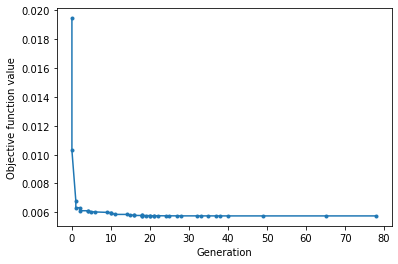

In [ ]:
# PLOT OF ITERATIONS VERSUS OBJECTIVE FUNCTION VALUE
%matplotlib inline
from matplotlib.ticker import MaxNLocator
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
# line plot of generation vs best scores 
plt.plot(generation, best_scores, '.-')
plt.xlabel('Generation')
plt.ylabel('Objective function value')
plt.show()

In [ ]:
# FINAL INTENSITY PLOT
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {}
plt.rcParams['figure.figsize'] = [200, 100]
plt.rcParams.update({'font.size': 100})

print('\n Final intensity plot : \n')
plot_intensities(v, a, b, c, decoded, n_g = 200)


 Final intensity plot : 



SIMULATED ANNEALING

In [ ]:
from numpy import random
from numpy.random import rand
from numpy.random import randn

# simulated annealing algorithm
def simulated_annealing(objective,bounds, n_iterations, step_size, temp):
    iterations = []
    scores = list()
    print('\n Implementing Simulated Annealing Algorithm ...... \n')
    # generate an initial point
    best = bounds[:, 0] + rand(len(bounds)) * (bounds[:, 1] - bounds[:, 0])
    # evaluate the initial point
    best_eval = objective(best)
    # current working solution
    curr, curr_eval = best, best_eval
    scores.append(best_eval)
    # run the algorithm
    for i in range(1,n_iterations+1):
        # take a step 
        candidate = curr + randn(len(bounds)) * step_size
        candidate = np.maximum(np.minimum(candidate,bounds[:,1]),bounds[:,0])
        # evaluate candidate point
        candidate_eval = objective(candidate)
        # check for new best solution
        if candidate_eval < best_eval:
            # store new best point
            best, best_eval = candidate, candidate_eval
            print('\n Iteration No. %d : '% (i))
            bulb_pos = best.tolist() ; bulb_position = [] 
            for nb in range(n_bulbs):
              temporary = bulb_pos[3*nb:3*nb+3]
              bulb_position.append(temporary)
            for nb in range(n_bulbs):
              print('Bulb %d new position = %s'%(nb+1,bulb_position[nb]))
            print('Objective function value = %f \n'% (best_eval))
            iterations.append(i)
            # keep track of scores
            scores.append(best_eval)
        # difference between candidate and current point evaluation
        diff = candidate_eval - curr_eval
        # calculate temperature for current epoch
        t = temp / float(i + 1)
        # calculate metropolis acceptance criterion
        metropolis = np.exp(-diff / t)
        # check if we should keep the new point
        if diff < 0 or rand() < metropolis:
            # store the new current point
            curr, curr_eval = candidate, candidate_eval
    return [best, best_eval, scores, iterations]

start_time = time.time()

# seed the pseudorandom number generator
random.seed(30)                                                       # hyperparameter
# define range for input
bounds = np.array(bounds)
# define the total iterations
n_iterations = 1000                                                     # hyperparameter
# initial temperature
temp = 10                                                             # hyperparameter
# define the maximum step size
step_size = 0.1                                                       # hyperparameter
# perform the simulated annealing search
best, score, scores, iterations = simulated_annealing(objective, bounds, n_iterations, step_size, temp)
print('Done!')

elapsed = time.time() - start_time
print('\n Computation time =  %.2f seconds \n'%(elapsed))

bulb_pos = best ; bulb_position = [] 
for nb in range(n_bulbs):
  temp = bulb_pos[3*nb:3*nb+3]
  bulb_position.append(temp)
for nb in range(n_bulbs):
  print('Bulb %d final position = %s'%(nb+1,bulb_position[nb]))
print('Final objective function value = %f '% (score))


 Implementing Simulated Annealing Algorithm ...... 


 Iteration No. 1 : 
Bulb 1 new position = [4.556095094859557, 1.0385379678513904, 4.537688766368322]
Objective function value = 0.038349 


 Iteration No. 3 : 
Bulb 1 new position = [4.453103826465855, 1.0777440210988258, 4.9595079923328695]
Objective function value = 0.037980 


 Iteration No. 4 : 
Bulb 1 new position = [4.529142334961484, 1.0491794697116972, 5.013344739989265]
Objective function value = 0.036024 


 Iteration No. 9 : 
Bulb 1 new position = [4.327559328133359, 0.8883621495772388, 4.682734552082469]
Objective function value = 0.032817 


 Iteration No. 23 : 
Bulb 1 new position = [4.118688043371189, 0.8283403871829439, 4.674617865585921]
Objective function value = 0.031026 


 Iteration No. 24 : 
Bulb 1 new position = [3.859755790314531, 0.8266901553081023, 4.668008796302521]
Objective function value = 0.030966 


 Iteration No. 25 : 
Bulb 1 new position = [3.84691921989556, 0.737132426577153, 4.72551856758702]
Obj

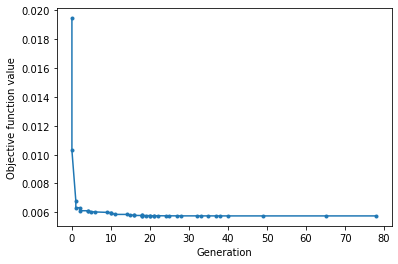

In [ ]:
# PLOT OF ITERATIONS VERSUS OBJECTIVE FUNCTION VALUE
%matplotlib inline
from matplotlib.ticker import MaxNLocator
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
# line plot of generation vs best scores 
plt.plot(generation, best_scores, '.-')
plt.xlabel('Generation')
plt.ylabel('Objective function value')
plt.show()

In [ ]:
# FINAL INTENSITY PLOT
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {}
plt.rcParams['figure.figsize'] = [200, 100]
plt.rcParams.update({'font.size': 100})

print('\n Final intensity plot : \n')
plot_intensities(v, a, b, c, best, n_g = 200)


 Final intensity plot : 



PARTICLE SWARM OPTIMISATION ALGORITHM

In [ ]:
from numpy import random
from numpy.random import randn
from numpy.random import rand

# particle swarm optimisation
def particle_swarm_optimisation(objective, bounds, n_pop, n_iterations):
  # Print initial position given by user and its objective function value
  iterations = []
  scores = list()

  print('\n Implementing Particle Swarm Optimisation Algorithm ...... \n')

  kappa = 1 ; phi1 = 2.05 ; phi2 = 2.05 ; phi = phi1 + phi2
  chi = 2*kappa/abs(2-phi-np.sqrt(phi**2-4*phi))
  w = chi ;  c1 = chi*phi1 ; c2 = chi*phi2

  MaxVelocity = np.array([0.2*(bounds[i][1]-bounds[i][0])  for i in range(len(bounds))]) 
  MinVelocity = np.array([-0.2*(bounds[i][1]-bounds[i][0]) for i in range(len(bounds))]) 

  # Initialize population members :
  # Generate random position of particles
  p_pos = np.array([[random.uniform(bounds[i][0],bounds[i][1]) for i in range(len(bounds))] for _ in range(n_pop)])
  
  # Initialize particle velocity
  p_vel = np.array([[0.0 for i in range(len(bounds))] for _ in range(n_pop)])
  
  # Compute objective function for initial position
  p_cost = np.array([objective(pos) for pos in p_pos.tolist()])
  
  # Initialize the best position and best cost
  p_best_pos = p_pos.copy()
  p_best_cost = p_cost.copy()

  global_best_cost = np.inf

  # Update global best
  for i in range(n_pop):
    if p_best_cost[i] < global_best_cost:
      global_best_pos = p_best_pos[i].copy()
      global_best_cost = p_best_cost[i].copy()     

  # Main loop of Particle Swarm Optimisation
  for iter in range(n_iterations):
    for i in range(n_pop):
      # Update particle velocity
      p_vel[i] = w*p_vel[i] + c1*rand(len(bounds))*(p_best_pos[i]-p_pos[i]) + c2*rand(len(bounds))*(global_best_pos-p_pos[i])
      # Ensure particle velocity is within bounds
      p_vel[i] = np.maximum(np.minimum(p_vel[i],MaxVelocity),MinVelocity)
      # Update particle position
      p_pos[i] = p_pos[i] + p_vel[i]
      # Ensure particle position is within bounds
      p_pos[i] = np.maximum(np.minimum(p_pos[i],bounds[:,1]),bounds[:,0])  
      # Calculate objective function/cost function
      p_cost[i] = objective(p_pos[i].tolist())       

      # Update the best particle position and best cost
      if p_cost[i] < p_best_cost[i]:
        p_best_pos[i] = p_pos[i].copy()
        p_best_cost[i] = p_cost[i].copy()         

        # Update global best position and cost   
        if p_best_cost[i] < global_best_cost:
          global_best_pos = p_best_pos[i].copy()
          global_best_cost = p_best_cost[i].copy()
          
          # Print the global best position and cost
          scores.append(global_best_cost)
          print('\n Iteration No. %d : '% (iter))
          bulb_pos = global_best_pos.tolist() ; bulb_position = [] 
          for nb in range(n_bulbs):
            temporary = bulb_pos[3*nb:3*nb+3]
            bulb_position.append(temporary)
          for nb in range(n_bulbs):
            print('Bulb %d new position = %s'%(nb+1,bulb_position[nb]))
          print('Objective function value = %f \n'% (global_best_cost))
          iterations.append(iter)    

  return global_best_pos, global_best_cost, iterations, scores

start_time = time.time()

# seed the pseudorandom number generator
random.seed(30)                                                      # hyperparameter
# define range for input
bounds = np.array(bounds)

# define the total iterations
n_iterations = 1000                                                    # hyperparameter
# define the population size 
n_pop = 100                                                          # hyperparameter
# perform the simulated annealing search
global_best_pos, global_best_cost, iterations, scores = particle_swarm_optimisation(objective, bounds, n_pop, n_iterations)
print('Done!')

elapsed = time.time() - start_time
print('\n Computation time =  %.2f seconds \n'%(elapsed))

bulb_pos = global_best_pos ; bulb_position = [] 
for nb in range(n_bulbs):
  temporary = bulb_pos[3*nb:3*nb+3]
  bulb_position.append(temporary)
for nb in range(n_bulbs):
  print('Bulb %d final position = %s'%(nb+1,bulb_position[nb]))
print('Final objective function value = %f '% (global_best_cost))


 Implementing Particle Swarm Optimisation Algorithm ...... 


 Iteration No. 1 : 
Bulb 1 new position = [6.519728435536307, 0.15587799138390523, 6.671201345086313]
Objective function value = 0.007536 


 Iteration No. 1 : 
Bulb 1 new position = [7.0, 0.0, 6.689287946642768]
Objective function value = 0.006211 


 Iteration No. 1 : 
Bulb 1 new position = [6.975231672965787, 0.0, 6.86940728947077]
Objective function value = 0.005978 


 Iteration No. 1 : 
Bulb 1 new position = [7.0, 0.0, 7.0]
Objective function value = 0.005745 



In [ ]:
# PLOT OF ITERATIONS VERSUS OBJECTIVE FUNCTION VALUE
%matplotlib inline
from matplotlib.ticker import MaxNLocator
ax = plt.figure().gca()
ax.xaxis.set_major_locator(MaxNLocator(integer=True))
# line plot of generation vs best scores 
plt.plot(generation, best_scores, '.-')
plt.xlabel('Generation')
plt.ylabel('Objective function value')
plt.show()

In [ ]:
# FINAL INTENSITY PLOT
%matplotlib inline
%config InlineBackend.print_figure_kwargs = {}
plt.rcParams['figure.figsize'] = [200, 100]
plt.rcParams.update({'font.size': 100})

print('\n Final intensity plot : \n')
plot_intensities(v, a, b, c, global_best_pos, n_g = 200)